In [ ]:
""" The ground truth masks provided by the dataset are very coarse. 
This script generates more precise masks by using the SegAnything model.
"""

# Setup

## Imports

In [1]:
"""Normal estimation"""
ROOT_DIR = "/home/user/Documents/projects/Metaworld"

import sys
sys.path.append(ROOT_DIR)

%matplotlib widget  
import argparse
import gc
import os
import json
import random
from PIL import Image
from typing import Dict, List, Union

import cv2
import numpy as np

import gc
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import PILToTensor
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
from scipy.spatial.transform import Rotation as R
import importlib
from typing import List
from easydict import EasyDict as edict
from tqdm import tqdm

# visualization
import plotly.express as px
import plotly.graph_objects as go
from lightglue import viz2d
from einops import rearrange

import open3d as o3d
from open3d.web_visualizer import draw

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
[Open3D INFO] Resetting default logger to print to terminal.


In [2]:
from keyframes.align_ft_spair import dataset
from keyframes.align_ft_spair.utils import geo_utils, spair_utils, ft_align_utils, depth_match_utils, geom_utils, img_utils, kpt_likelihood_utils, kpt_likelihood_opt_v2, focal_opt_utils, peak_extraction_utils
from keyframes.align_ft_spair import pl_modules
from keyframes.align_ft_spair.ext import projection_network, utils_correspondence, utils_dataset
from utils import torch_utils, plotly_utils

## Data

In [3]:
# params
spair_data_folder="/media/user/ssd2t/datasets2/SPair-71k"
embds_folder_geo="/media/user/EXTREMESSD/datasets/SPair-71k/geo"
embds_folder_sd="/media/user/EXTREMESSD/datasets/SPair-71k/DiffusionFeatures60x60"
img_files_np_path_train="/home/user/Documents/projects/diffusion-features/experiments/ft_align/aeroplane_train_files_unique.npy"
img_files_np_path_eval="/home/user/Documents/projects/diffusion-features/experiments/ft_align/aeroplane_eval_files_unique.npy"
depth_folder = "/media/user/EXTREMESSD/datasets/SPair-71k/miragold"
# kpt_indices=[3, 4, 5]
category="aeroplane"
img_size=960
embd_size=60
pad=True

img_files_train = np.load(img_files_np_path_train).tolist()
img_files_eval = np.load(img_files_np_path_eval).tolist()

flips_train = [False]
flips_eval = [False]

In [4]:
# load embeddings
img_embds_train, img_embds_hat_train = geo_utils.load_geo_embds(
    img_files_train,
    embds_folder_dino=embds_folder_geo,
    embds_folder_sd=embds_folder_sd,
    flips=flips_train,
)
img_embds_train = img_embds_train.detach().cpu()
img_embds_hat_train = img_embds_hat_train.detach().cpu()

# load embeddings
img_embds_eval, img_embds_hat_eval = geo_utils.load_geo_embds(
    img_files_eval,
    embds_folder_dino=embds_folder_geo,
    embds_folder_sd=embds_folder_sd,
    flips=flips_eval,
)
img_embds_eval = img_embds_eval.detach().cpu()
img_embds_hat_eval = img_embds_hat_eval.detach().cpu()

# build kpt_idx_to_kpt_embds
kpt_idx_to_kpt_embds_train, kpt_embd_coords_train, kpt_img_coords_train = spair_utils.build_kpt_idx_to_kpt_embds(
    img_files=img_files_train,
    img_embds_hat=img_embds_hat_train,
    spair_data_folder=spair_data_folder,
    img_size=img_size,
    embd_size=embd_size,
    pad=pad,
    flips=flips_train
)
kpt_idx_to_kpt_embds_eval, kpt_embd_coords_eval, kpt_img_coords_eval = spair_utils.build_kpt_idx_to_kpt_embds(
    img_files=img_files_eval,
    img_embds_hat=img_embds_hat_eval,
    spair_data_folder=spair_data_folder,
    img_size=img_size,
    embd_size=embd_size,
    pad=pad,
    flips=flips_eval
)

# average keypoint embeddings
kpt_features_avg_train = []
kpt_features_attn_avg_train = []
kpt_features_attn_sd_train = []
for kpt_idx in range(30):
    kpt_features = kpt_idx_to_kpt_embds_train[kpt_idx]
    # kpt_features is only None if keypoint label does not exist for object category
    if kpt_features is None:
        break

    if kpt_idx > 3 and kpt_idx < 22:
        kpt_idx_2 = kpt_idx + 1 if kpt_idx % 2 == 0 else kpt_idx - 1
        kpt_features_2 = kpt_idx_to_kpt_embds_train[kpt_idx_2]
        assert kpt_features_2 is not None, f"kpt_features is None for kpt_idx={kpt_idx_2}"
        kpt_features = torch.cat([kpt_features, kpt_features_2], dim=0)

    kpt_features_avg = torch.mean(kpt_features, dim=0, keepdim=True)  # (1, C)
    # compute dot product between kpt_features and kpt_features_avg
    kpt_features_attn = torch.bmm(kpt_features.unsqueeze(0), kpt_features_avg.unsqueeze(2)).squeeze(0)
    kpt_features_attn_avg = torch.mean(kpt_features_attn, dim=0, keepdim=True)
    kpt_features_attn_sd = torch.std(kpt_features_attn, dim=0, keepdim=True)
    kpt_features_avg_train.append(kpt_features_avg)
    kpt_features_attn_avg_train.append(kpt_features_attn_avg)
    kpt_features_attn_sd_train.append(kpt_features_attn_sd)

kpt_features_avg_train = torch.cat(kpt_features_avg_train, dim=0)
kpt_features_attn_avg_train = torch.cat(kpt_features_attn_avg_train, dim=0)
kpt_features_attn_sd_train = torch.cat(kpt_features_attn_sd_train, dim=0)
# print(kpt_features_avg_train.shape)

# 1.1) load depth
depths_train = []
for img_file in img_files_train:
    fn = os.path.basename(img_file).split(".")[0]
    depth_file = f"{depth_folder}/{category}/depth_npy/{fn}_pred.npy"
    depth = np.load(depth_file)
    # NOTE instead of resizing depth we will resize and upscale attentions
    depths_train.append(depth)

depths_eval = []
for img_file in img_files_eval:
    fn = os.path.basename(img_file).split(".")[0]
    depth_file = f"{depth_folder}/{category}/depth_npy/{fn}_pred.npy"
    depth = np.load(depth_file)
    depths_eval.append(depth)

# 1.3) reproject to point clouds
xyz_train = []
for depth in depths_train:
    v0 = geom_utils.reproject_depth(depth)
    xyz_train.append(v0)

xyz_eval = []
for depth in depths_eval:
    v0 = geom_utils.reproject_depth(depth)
    xyz_eval.append(v0)

# TODO save xyz

# px.imshow(depths_padded_resized_train[20])


# TODO load segmentation masks



# Method

In [7]:
from segment_anything import SamPredictor, sam_model_registry
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

In [8]:
"""
checkpoints:
  # feature_extractor downloaded automatically
  dir: /home/user/Documents/model_ckpts
  files:
    # lightglue_epoch=34-step=3885.ckpt
    feature_matcher: lightglue_bricks_epoch=787-step=77224.ckpt
    seg_any: sam_vit_h_4b8939.pth
    mcc: co3dv2_all_categories.pth
"""
ckpt_path="/home/user/Documents/model_ckpts/sam_vit_h_4b8939.pth"
sam = sam_model_registry["vit_h"](checkpoint=ckpt_path)
sam.to("cuda")

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [9]:
mask_generator = SamAutomaticMaskGenerator(sam)

In [ ]:
predictor = SamPredictor(sam)

## Experiment All Masks

In [10]:
i=0

In [11]:
img_idx=i
i+=1
img=np.array(Image.open(img_files_train[img_idx]))
masks = mask_generator.generate(img)


In [13]:
from keyframes import seg_any

In [20]:
masks[0]["segmentation"]

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [False, False, False, ..., False, False, False]])

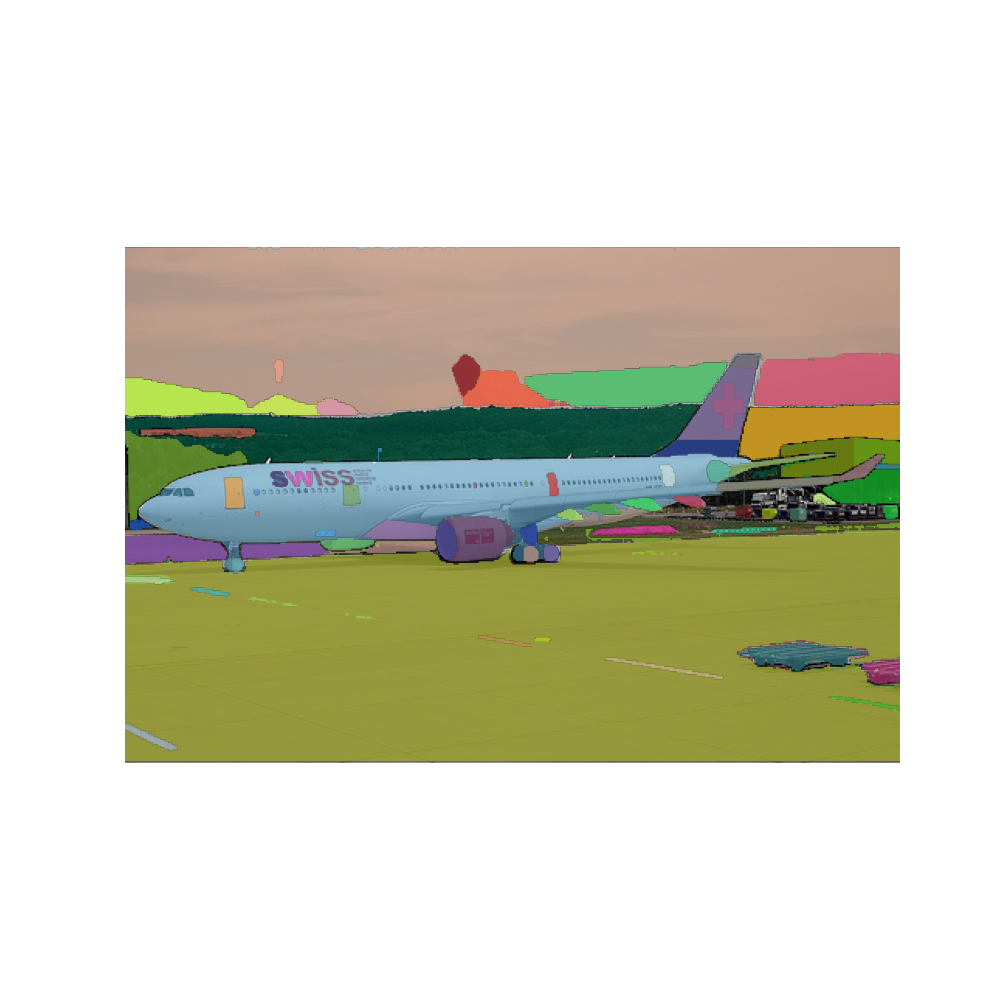

In [23]:
plt.figure(figsize=(10, 10))
plt.imshow(img)
for mask in masks:
    seg_any.show_mask(mask["segmentation"], plt.gca(), random_color=True)

plt.axis('off')
plt.show()

In [21]:
px.imshow(masks[0]["segmentation"])

In [26]:
masks[0].keys()

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])

In [29]:
masks[0]["stability_score"]

0.9757773280143738

## Generate Auto Masks for all images

In [31]:
out_dir="/media/user/EXTREMESSD/datasets/SPair-71k/SegAnyMasks"
category="aeroplane"

In [32]:
for img_idx in tqdm(range(len(img_files_train))):
    img=np.array(Image.open(img_files_train[img_idx]))
    input_points=kpt_img_coords_train[img_idx].numpy()[:,:2]
    input_labels=np.ones(input_points.shape[0], dtype=int)
    masks = mask_generator.generate(img)

    masks_seg = [mask["segmentation"] for mask in masks]
    masks_areas = [mask["area"] for mask in masks]
    masks_stability_scores = [mask["stability_score"] for mask in masks]

    # stack
    masks_seg_np = np.stack(masks_seg, axis=0)
    masks_areas_np = np.array(masks_areas)
    masks_stability_scores_np = np.array(masks_stability_scores)

    # save
    folder = f"{out_dir}/{category}"
    # create folder if not exist
    os.makedirs(folder, exist_ok=True)
    file_id = os.path.basename(img_files_train[img_idx]).split('.')[0]
    mask_seg_file = f"{folder}/{file_id}_auto_masks_seg.npy"
    mask_areas_file = f"{folder}/{file_id}_auto_masks_areas.npy"
    mask_stability_scores_file = f"{folder}/{file_id}_auto_masks_stability_scores.npy"
    np.save(mask_seg_file, masks_seg_np)
    np.save(mask_areas_file, masks_areas_np)
    np.save(mask_stability_scores_file, masks_stability_scores_np)

100%|██████████| 55/55 [02:31<00:00,  2.76s/it]


## Experiment

In [85]:
i=0

In [102]:
img_idx=i
i+=1
img=np.array(Image.open(img_files_train[img_idx]))
input_points=kpt_img_coords_train[img_idx].numpy()[:,:2]
input_labels=np.ones(input_points.shape[0], dtype=int)

predictor.set_image(img)

# img_depth = np.repeat(xyz_train[img_idx][:,:,2][:,:,None]*255,3,axis=2).astype(np.uint8)
# predictor.set_image(img_depth)

masks, mask_scores, logits = predictor.predict(
    point_coords=input_points[:,:], 
    point_labels=input_labels[:]
)
px.imshow(xyz_train[img_idx][:,:,2] + masks[2])

## Run Loop

In [106]:
out_dir="/media/user/EXTREMESSD/datasets/SPair-71k/SegAnyMasks"
category="aeroplane"

In [109]:
for img_idx in tqdm(range(len(img_files_train))):
    img=np.array(Image.open(img_files_train[img_idx]))
    input_points=kpt_img_coords_train[img_idx].numpy()[:,:2]
    input_labels=np.ones(input_points.shape[0], dtype=int)
    # NOTE predict for img works better than on the depth map
    predictor.set_image(img)
    masks, mask_scores, logits = predictor.predict(
        point_coords=input_points[:,:], 
        point_labels=input_labels[:]
    )
    
    # mask=masks[2]
    # mask = cv2.resize(mask, (960, 960), interpolation=cv2.INTER_NEAREST)
    # mask = (mask > 0.5).astype(np.uint8)
    # mask = cv2.dilate(mask, np.ones((5, 5), np.uint8), iterations=1)
    # mask = cv2.erode(mask, np.ones((5, 5), np.uint8), iterations=1)
    # mask = cv2.resize(mask, (960, 960), interpolation=cv2.INTER_NEAREST)
    
    folder = f"{out_dir}/{category}"
    # create folder if not exist
    os.makedirs(folder, exist_ok=True)
    mask_seg_file = f"{folder}/{os.path.basename(img_files_train[img_idx]).split('.')[0]}_masks.npy"

    np.save(mask_seg_file, masks)

100%|██████████| 55/55 [00:24<00:00,  2.27it/s]


In [117]:
# load mask
img_idx=0
mask_seg_file=f"{out_dir}/{category}/{os.path.basename(img_files_train[img_idx]).split('.')[0]}_masks.npy"
masks = np.load(mask_seg_file)
# px.imshow(xyz_train[img_idx][:,:,2] + masks[2])
img = np.array(Image.open(img_files_train[img_idx]))
px.imshow(img/2 + masks[2][:,:,None]*255/2)